In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

DESC version 0+untagged.9463.gc6b5ccf.dirty,using JAX backend, jax version=0.4.38, jaxlib version=0.4.38, dtype=float64
Using device: CPU, with 17.86 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

'''surf1 = FourierRZToroidalSurface(
    R_lmn=[0, 0, 0, 0, 5, 1, 0, 0, 0],
    modes_R=[
        (-2, -2),
        (-1, -2),
        (-2, -1),
        (-1, -1),
        (0, 0),
        (1, 0),
        (2, 0),
        (0, 1),
        (1, 1)
    ],  # (m,n) pairs corresponding to R_mn on previous line
    Z_lmn=[1],
    modes_Z=[(-1, 0)],
    NFP=1,
)


eq_qs = Equilibrium(
    L=1,  # radial resolution
    M=2,  # poloidal resolution
    N=2,  # toroidal resolution
    surface=surf1
)'''


#plot_boundary(eq_qs, figsize=(6,6))
#plot_boozer_surface(eq_qs, figsize=(6,6))
#plot_3d(eq_qs, "|B|", figsize=(6,6))

'surf1 = FourierRZToroidalSurface(\n    R_lmn=[0, 0, 0, 0, 5, 1, 0, 0, 0],\n    modes_R=[\n        (-2, -2),\n        (-1, -2),\n        (-2, -1),\n        (-1, -1),\n        (0, 0),\n        (1, 0),\n        (2, 0),\n        (0, 1),\n        (1, 1)\n    ],  # (m,n) pairs corresponding to R_mn on previous line\n    Z_lmn=[1],\n    modes_Z=[(-1, 0)],\n    NFP=1,\n)\n\n\neq_qs = Equilibrium(\n    L=1,  # radial resolution\n    M=2,  # poloidal resolution\n    N=2,  # toroidal resolution\n    surface=surf1\n)'

In [3]:
optimizer = Optimizer("lsq-exact")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode)
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    #print(eq_qs.surface.R_basis.modes)
    #print(len(eq_qs.surface.R_basis.modes))
    #print(eq_qs.surface.R_basis.num_modes)
    #print(fixed_R_modes)
    #print(free_R_modes)
    #free_R_modes = free_R_modes[1:]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    #print(free_Z_modes)
    
    objective_f = ObjectiveFunction((
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        #ForceBalance(eq=eq_qs, weight=10),
        #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
        #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
        AspectRatio(eq=eq_qs, target=6, weight=1)
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
        #FixBoundaryR(eq=eq_qs, modes=free_R_modes, bounds=Rbounds),
        #FixBoundaryZ(eq=eq_qs, modes=free_Z_modes, bounds=Zbounds),
    )

    #print(eq_qs.x_idx)
    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )


all_objs [<desc.objectives.linear_objectives.FixBoundaryR object at 0x1696edc90>, <desc.objectives.linear_objectives.FixBoundaryZ object at 0x16c858d90>, <desc.objectives.linear_objectives.FixPressure object at 0x1696f2510>, <desc.objectives.linear_objectives.FixPsi object at 0x1696bbb10>, <desc.objectives.linear_objectives.FixCurrent object at 0x1697372d0>, <desc.objectives._geometry.AspectRatio object at 0x16c8c6390>]
objective <desc.objectives.objective_funs.ObjectiveFunction object at 0x1696ee690>
nonlinear_constraints ()
Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 463 ms
Timer: Objective build = 511 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self

/Users/aak572/mason_desc_branch/DESC/desc/optimize/optimizer.py:268: UserWarning: method lsq-exact is not intended for scalar objective function
  warnings.warn(


x0 [ 8.42277063e-04  1.75949790e-04 -1.65517843e-09 -6.12567616e-05
 -5.05373969e-04  1.22518404e-04 -3.54606368e-10 -5.05375397e-04
 -6.12568844e-05 -5.40454095e-10  4.61651235e-02  9.83550318e-09
  4.70448749e-02 -9.48327549e-02 -1.16003649e-08  4.61651218e-02
 -9.48327575e-02  1.36288533e-04 -1.10954337e-08 -2.27147731e-04
  4.64583721e-02  9.65447799e-09  1.36290174e-04  4.64583746e-02
  1.46826012e-10 -1.01584856e-04  9.36046966e-10  3.09809968e-01
 -1.01584724e-04  1.59366406e-10  3.09809968e-01 -1.09124655e-01
 -2.50657131e-03  9.16668713e-02 -2.30158265e-03 -1.01584764e-04
  3.09809968e-01 -1.01584764e-04  3.09809968e-01 -1.74229349e-01
  7.49178136e-02 -1.74229349e-01  7.49178136e-02 -2.12023611e-01
  1.30176760e-03 -2.12023611e-01  1.30176753e-03  1.30176756e-03
 -8.02791765e-03  1.30176756e-03 -8.02791714e-03 -8.02791703e-03
 -2.13386502e-01 -8.02791703e-03 -2.13386502e-01 -8.00825079e-08
 -9.13081188e-09  8.05727083e-08 -1.15025188e-10  9.01513404e-09
 -1.49804071e-10 -5.37

In [5]:
print(result.x.shape, result.allx[-1].shape)
print(objective_f.compute_scalar(result.allx[-1]))

(171,) (363,)
1.347395087280209e-09


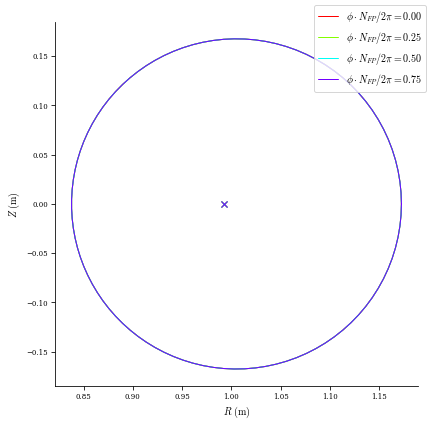

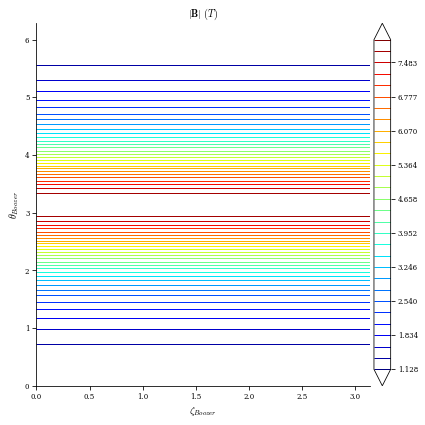

In [6]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [7]:
# x = result.allx[-1]
# objective_f = ObjectiveFunction(
#         #RotationalTransform(eq=eq_qs, target=0.5, weight=1, loss_function="mean", grid=grid_vol),
#         QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 4), weight=1)
#     )
# objective_f.build()
# print(objective_f.compute_scalar(x))

In [8]:
eq_qs = eq_init.copy()
objective_f = ObjectiveFunction((
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        #ForceBalance(eq=eq_qs, weight=10),
        #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
        #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
        AspectRatio(eq=eq_qs, target=6, weight=1)
    ))

optimizer = Optimizer("Turbo1")

for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode)
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    #print(eq_qs.surface.R_basis.modes)
    #print(len(eq_qs.surface.R_basis.modes))
    #print(eq_qs.surface.R_basis.num_modes)
    #print(fixed_R_modes)
    #print(free_R_modes)
    #free_R_modes = free_R_modes[1:]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    #print(free_Z_modes)
    
    # objective_f = ObjectiveFunction((
    #     #FixPressure(eq=eq_qs, weight=constWeight),
    #     #FixCurrent(eq=eq_qs, weight=constWeight),
    #     #FixPsi(eq=eq_qs, weight=constWeight),
    #     #ForceBalance(eq=eq_qs, weight=1),
    #     #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
    #     #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
    #     AspectRatio(eq=eq_qs, target=6, weight=1)
    # ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
        #FixBoundaryR(eq=eq_qs, modes=free_R_modes, bounds=Rbounds),
        #FixBoundaryZ(eq=eq_qs, modes=free_Z_modes, bounds=Zbounds),
    )

    #print(eq_qs.x_idx)
    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=500,
        options={"trust_regions":2, "box_size":1e-2}
    )

all_objs [<desc.objectives.linear_objectives.FixBoundaryR object at 0x3677bafd0>, <desc.objectives.linear_objectives.FixBoundaryZ object at 0x381a9b390>, <desc.objectives.linear_objectives.FixPressure object at 0x38cea1e90>, <desc.objectives.linear_objectives.FixPsi object at 0x3885c2c90>, <desc.objectives.linear_objectives.FixCurrent object at 0x38ce97750>, <desc.objectives._geometry.AspectRatio object at 0x16c892e10>]
objective <desc.objectives.objective_funs.ObjectiveFunction object at 0x38ced2510>
nonlinear_constraints ()
Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 14.1 ms
Timer: Objective build = 19.3 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z se

In [9]:
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))
print(np.shape(result.x), np.shape(result.allx[-1]), np.shape(result.allx))

2.1215483748061932e-12
(171,) (363,) (842, 363)


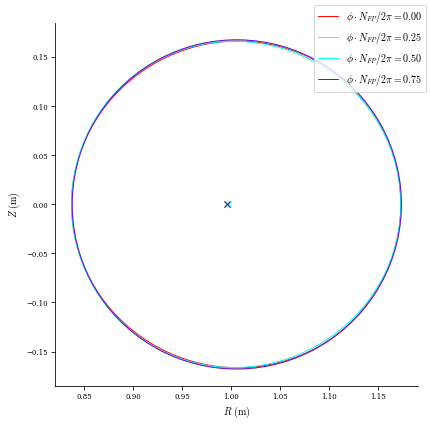

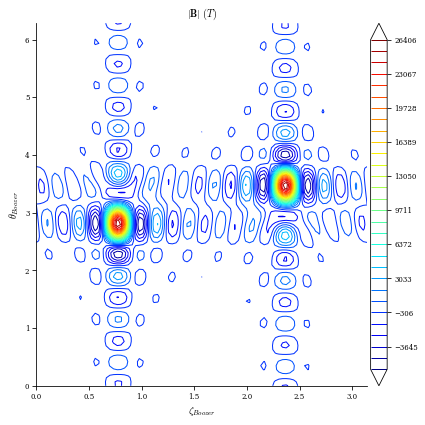

In [10]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))

In [11]:
objective_f = ObjectiveFunction((
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        #ForceBalance(eq=eq_qs, weight=10),
        #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
        #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
        AspectRatio(eq=eq_qs, target=6, weight=1)
    ))
objective_f.build()
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))

Building objective: aspect ratio
Precomputing transforms
2.1215483748061932e-12


In [17]:
print(np.shape(result.x))
print(np.shape(result.allx))

(171,)
(842, 363)


In [20]:
objective_f.print_value(result.allx[np.argmin(result.allfun)])

Total (sum of squares):  2.122e-12, 
Aspect ratio:  6.000e+00 (dimensionless)
